In [1]:
inputFile='data.xlsx'
outputFile='output_for_'+inputFile

import pandas as pd
data=pd.read_excel(inputFile,sheet_name=None,index_col=0)
centers=data['Fulfilment Centers']
regions=data['Regions']
distances=data['Distances']
items=data['Items']
demand=data['Demand']
items['density']=items['shipping_weight']/items['storage_size']

data2=pd.read_excel(outputFile,sheet_name=None)
shadowPrice=data2['Capacity Constraints']
shipment=data2['Solution']

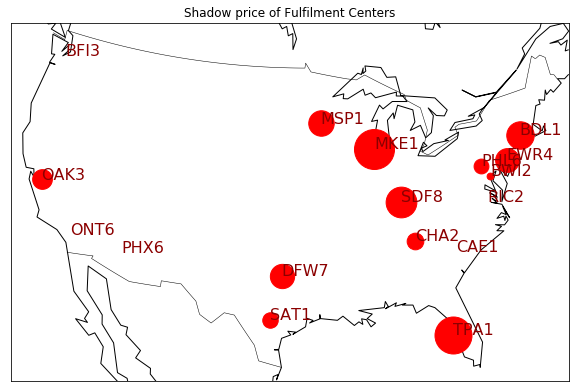

In [2]:
# Plot shadow prices of fulfilment centers
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import numpy as np

plt.figure(figsize=(10,8))
# create the map
map = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
        projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
map.drawcountries()
map.drawcoastlines()

mult=40/(np.sqrt(shadowPrice.abs().max()))
for fc_name in centers.index:
    x,y=map(centers.loc[fc_name,'long'],centers.loc[fc_name,'lat'])
    plt.plot(x,y,'ro',markersize=np.sqrt(abs(shadowPrice.loc[fc_name]))*mult)
    plt.text(x,y,fc_name,fontdict={'size':16,'color':'darkred'})
plt.title('Shadow price of Fulfilment Centers')
plt.show()

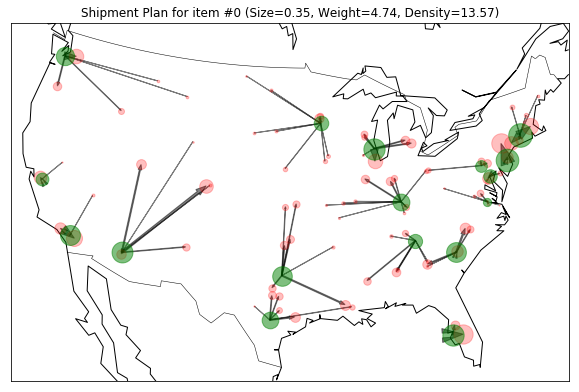

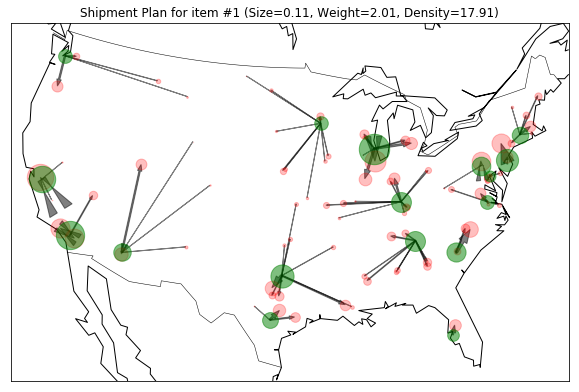

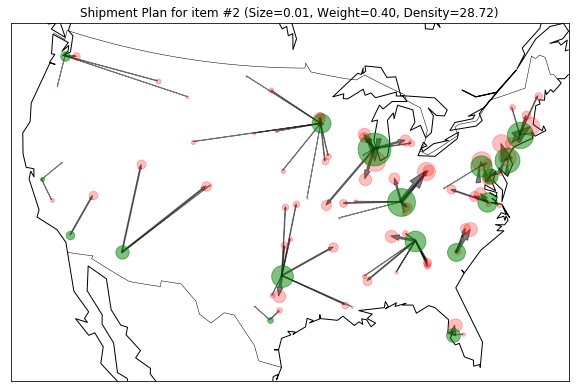

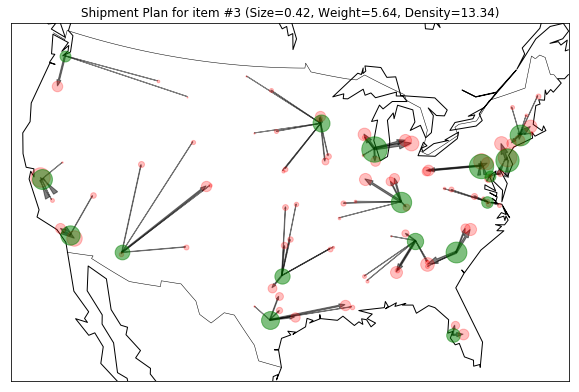

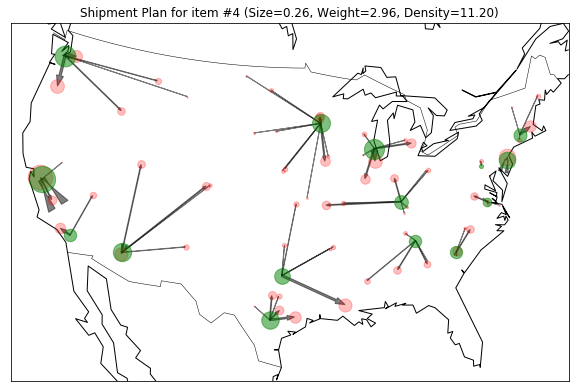

...

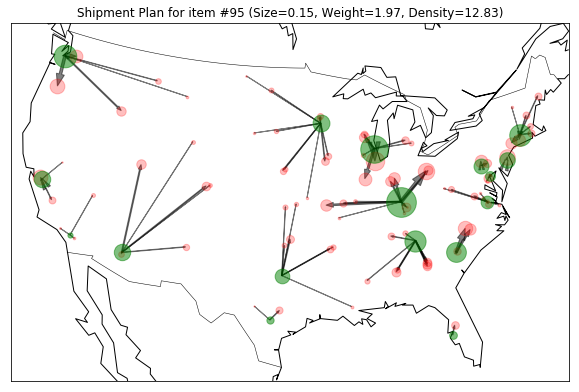

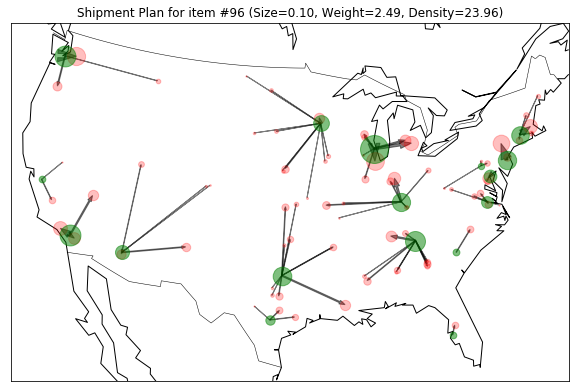

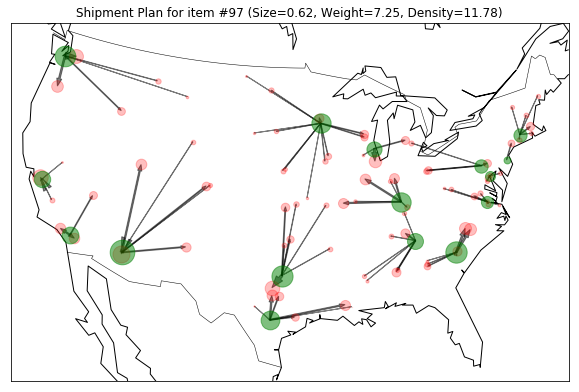

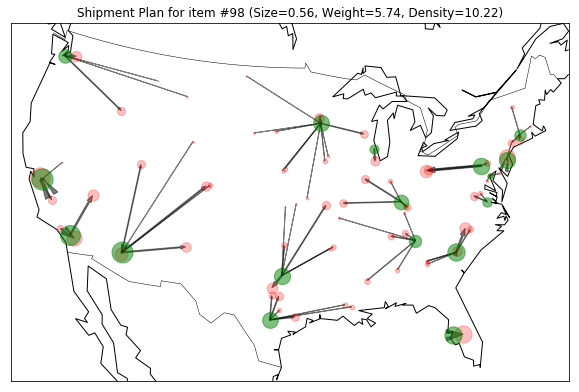

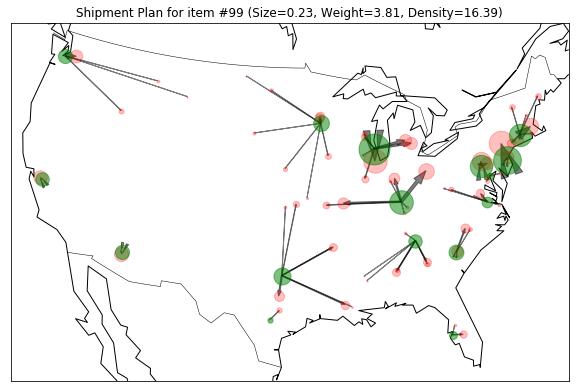

In [3]:
# Plot shipment plans
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

mult=40/(np.sqrt(shipment.groupby(['FC_name','item_ID'])['Shipment'].sum().max()))
mult2=100000/shipment['Shipment'].max()

for item_ID, df in shipment.groupby('item_ID'):
    plt.figure(figsize=(10,8))
    # create the map
    map = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
            projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
    map.drawcountries()
    map.drawcoastlines()
    
    totInFC=df.groupby('FC_name')['Shipment'].sum()
    
    for reg_ID in regions.index:
        x,y=map(regions.loc[reg_ID,'long'],regions.loc[reg_ID,'lat'])
        plt.plot(x,y,'ro',markersize=np.sqrt(demand.loc[item_ID,reg_ID])*mult,alpha=0.25)
    
    for fc_name in totInFC.index:
        x,y=map(centers.loc[fc_name,'long'],centers.loc[fc_name,'lat'])
        plt.plot(x,y,'go',markersize=np.sqrt(totInFC[fc_name])*mult,alpha=0.5)
        #plt.text(x,y,fc_name,fontdict={'color':'darkred','size':16})
    
    for ind in df.index:
        fc_name=df.loc[ind,'FC_name']
        region_ID=df.loc[ind,'region_ID']
        value=df.loc[ind,'Shipment']
        x1,y1=map(centers.loc[fc_name,'long'],centers.loc[fc_name,'lat'])
        x2,y2=map(regions.loc[region_ID,'long'],regions.loc[region_ID,'lat'])
        width=value*mult2
        plt.arrow(x1,y1,x2-x1,y2-y1,width=width,color='black',length_includes_head=True,alpha=0.5)
        
    plt.title('Shipment Plan for item #{0:d} (Size={1:.2f}, Weight={2:.2f}, Density={3:.2f})'.format(item_ID,items.loc[item_ID,'storage_size'],items.loc[item_ID,'shipping_weight'],items.loc[item_ID,'density']))
    plt.show()
    plt.close()